## Queries

Let's try the same thing, with even more data added to our database. 

This database contains ~25,000 images from the ADE20K dataset, and ~2,000 movie posters from TMDB.

### Set-up

In [2]:
import weaviate
import weaviate.classes as wvc
import os
from sentence_transformers import SentenceTransformer
from PIL import Image
import requests
from pathlib import Path
import base64
import matplotlib.pyplot as plt

# The original clip-ViT-B-32 for encoding images
img_model = SentenceTransformer('clip-ViT-B-32')

# The second model is aligned - i.e. it maps to the same vector space as the original model
text_model = SentenceTransformer('sentence-transformers/clip-ViT-B-32-multilingual-v1')

# Read more about the models at:
# https://huggingface.co/sentence-transformers/clip-ViT-B-32
# https://huggingface.co/sentence-transformers/clip-ViT-B-32-multilingual-v1

### Helper functions

In [3]:
# Helper function for loading an image or URL
def load_image(url_or_path):
    if url_or_path.startswith("http://") or url_or_path.startswith("https://"):
        return Image.open(requests.get(url_or_path, stream=True).raw)
    else:
        return Image.open(url_or_path)


# Helper function to convert a file to base64 representation
def to_base64(path):
    with open(path, 'rb') as file:
        return base64.b64encode(file.read()).decode('utf-8')


# Helper function to get the vector of an image
def get_img_vector(img_path: str):
    vector = img_model.encode([load_image(img_path)])[0].tolist()
    return vector


# Helper function to get the vector of a text
def get_text_vector(text: str):
    vector = text_model.encode([text])[0].tolist()
    return vector


# Helper function for showing images in Jupyter (using Matplotlib)
def show_images(response, src_img=None):
    # Load all 3 images into a list and show them in Jupyter with matplotlib
    images = [load_image(o.properties["file_path"]) for o in response.objects]
    if src_img:
        images = [src_img] + images
    _, axs = plt.subplots(1, len(images), figsize=(20, 10))
    for i, img in enumerate(images):
        axs[i].imshow(img)
        axs[i].axis('off')
    return None

### Connect to Weaviate

This time, I am using a different Weaviate instance - served in the cloud. 

Note the authentication details in the connection script.

In [4]:
client = weaviate.connect_to_wcs(
    cluster_url=os.getenv("JP_WCS_URL"),
    auth_credentials=weaviate.auth.AuthApiKey(os.getenv("JP_WCS_ADMIN_KEY"))
)

### Instantiate the existing collection 

This enables us to use the existing collection, and query it.

In [5]:
collection_name = "MultiModal"
mm_coll = client.collections.get(collection_name)

### Queries

#### Query 1: Find images that are similar to a given image

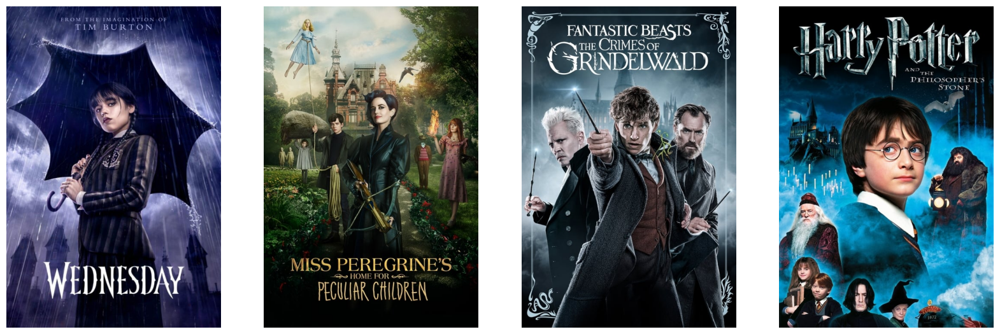

In [6]:
image_path = "data/query/tv_wednesday.jpg"
src_img = load_image(image_path)

response = mm_coll.query.near_vector(
    near_vector=get_img_vector("data/query/tv_wednesday.jpg"),
    limit=3,
    return_properties=["image", "file_path", "img_source"],
)

show_images(response, src_img)

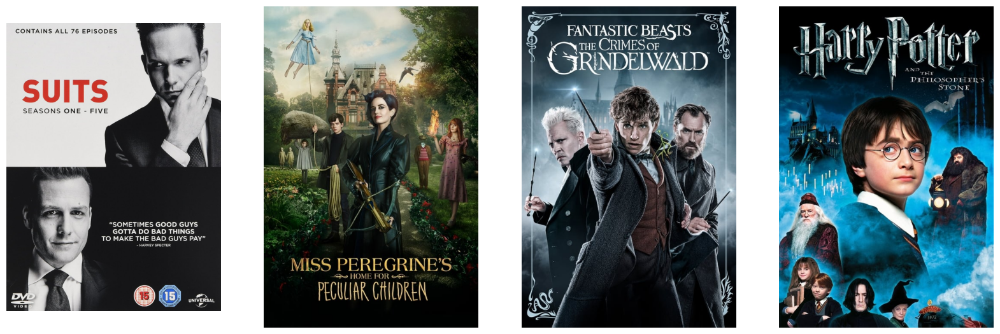

In [7]:
image_path = "data/query/tv_suits_5.jpg"
src_img = load_image(image_path)

response = mm_coll.query.near_vector(
    near_vector=get_img_vector("data/query/tv_wednesday.jpg"),
    limit=3,
    return_properties=["image", "file_path", "img_source"],
)

show_images(response, src_img)

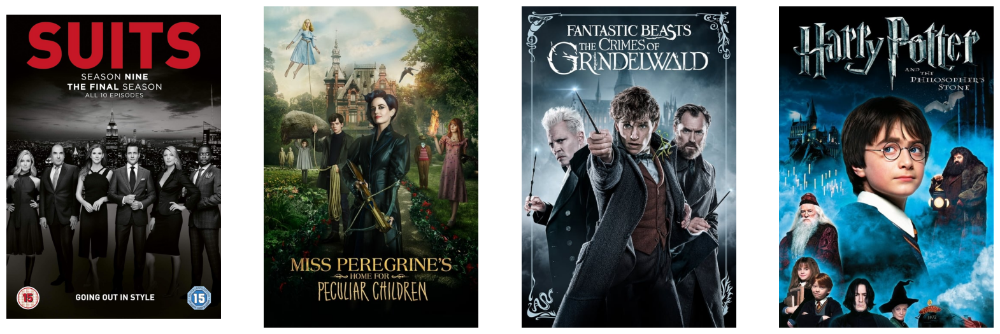

In [8]:
image_path = "data/query/tv_suits_10.jpg"
src_img = load_image(image_path)

response = mm_coll.query.near_vector(
    near_vector=get_img_vector("data/query/tv_wednesday.jpg"),
    limit=3,
    return_properties=["image", "file_path", "img_source"],
)

show_images(response, src_img)

#### Query 2: Find images that are similar to a given text

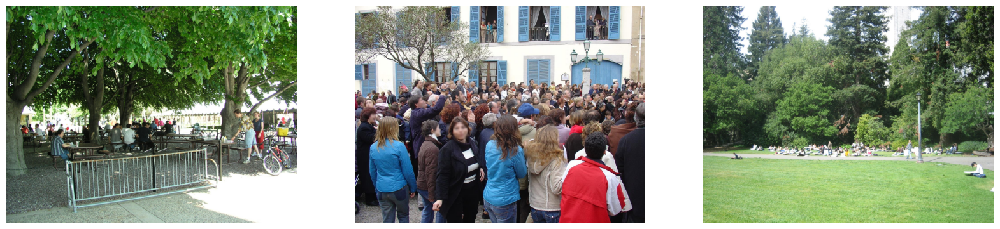

In [9]:
response = mm_coll.query.near_vector(
    near_vector=get_text_vector(
        """
        a crowd of people
        """
    ),
    limit=3,
    return_properties=["image", "file_path", "img_source"],
)

show_images(response)

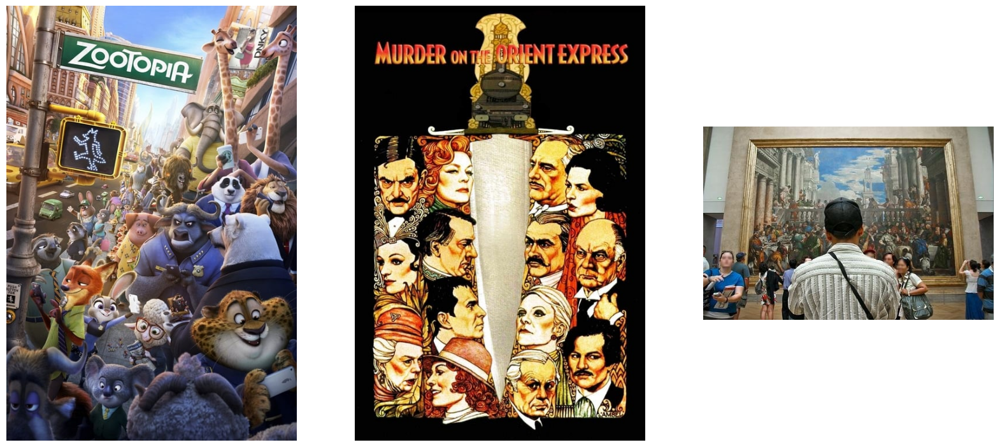

In [10]:
response = mm_coll.query.near_vector(
    near_vector=get_text_vector(
        """
        a poster of
        a crowd of people
        """
    ),
    limit=3,
    return_properties=["image", "file_path", "img_source"],
)

show_images(response)

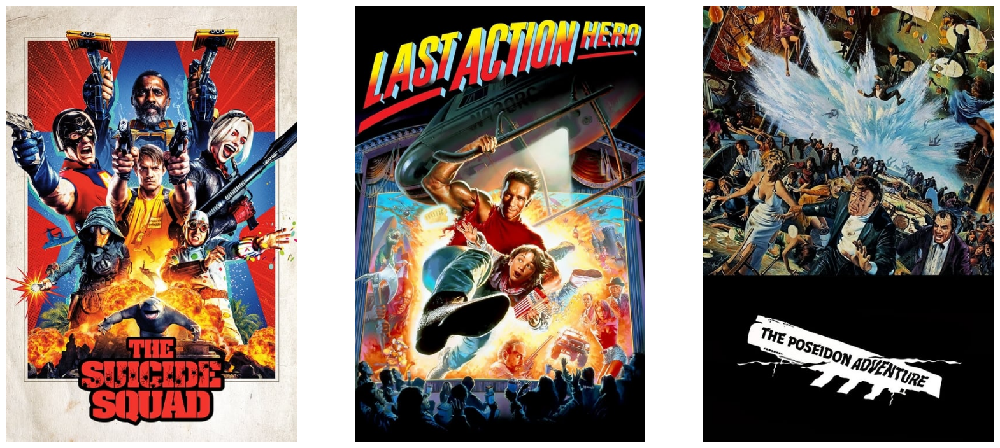

In [11]:
response = mm_coll.query.near_vector(
    near_vector=get_text_vector(
        """
        a poster of
        an action movie with
        a crowd of people
        """
    ),
    limit=3,
    return_properties=["image", "file_path", "img_source"],
)

show_images(response)

### Bonus: Multi-modal RAG

In [13]:
from openai import OpenAI
import os

client = OpenAI()
client.api_key = os.getenv("OPENAI_APIKEY")

In [14]:
def ask_gpt4v(query, weaviate_response):
    message_content = [
        {"type": "text", "text": query},
    ]

    for o in weaviate_response.objects:
        message_content.append(
            {
                "type": "image_url",
                "image_url": {"url": f"data:image/jpeg;base64,{o.properties['image']}"},
            }
        )

    oai_response = client.chat.completions.create(
        model="gpt-4-vision-preview",
        messages=[
            {
                "role": "user",
                "content": message_content,
            }
        ],
        max_tokens=300,
    )
    return oai_response.choices[0].message.content

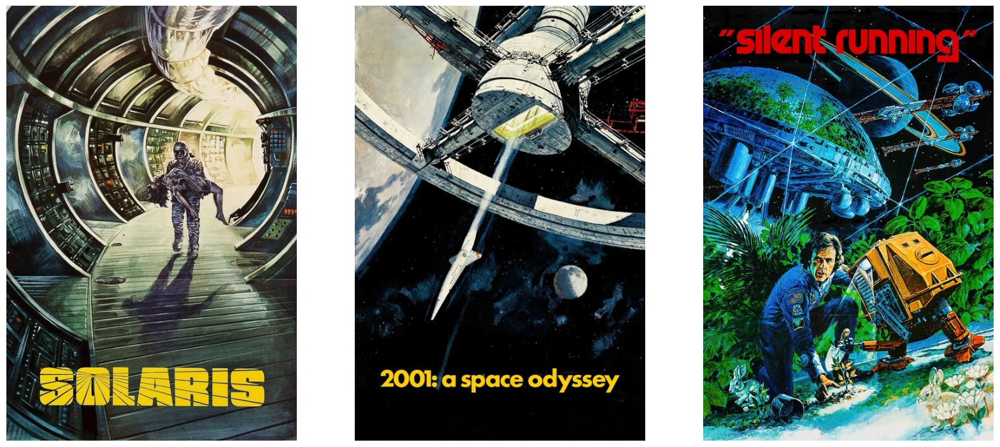

In [15]:
response = mm_coll.query.near_vector(
    near_vector=get_text_vector(
        """
        science fiction movie poster
        set in space
        intrieging vibe
        """
    ),
    limit=3,
    return_properties=["image", "file_path", "img_source"],
    filters=wvc.query.Filter.by_property("img_source").equal("TMDB")
)

show_images(response)

In [16]:
ask_gpt4v("What themes do these images have in common? Answer in 2-5 separate words.", response)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...

To disable this warning, you can either:

	- Avoid using `tokenizers` before the fork if possible

	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


'Science Fiction, Space Exploration'

In [17]:
print(ask_gpt4v("What elements do these posters have in common? What might make them successful posters? Describe in point form, citing why for each image.", response))

The posters have several elements in common that contribute to their potential success:



1. Science Fiction Theme:

   - All three posters depict scenes from science fiction settings and narratives.

   - Why: The imagery of space exploration, futuristic technology, and extraterrestrial environments can spark curiosity and appeal to fans of the genre.



2. Detailed Artwork:

   - Each poster features detailed and intricate illustrations that catch the eye.

   - Why: The high level of detail in the artwork can draw viewers in for a closer look, making the posters more engaging and memorable.



3. Dramatic Perspective:

   - The use of perspective is prominent in all three posters, creating a sense of depth and drama.

   - Why: This evokes a feeling of being part of the scene, potentially exciting viewers about the story's scope and scale.



4. Bold Title Text:

   - The titles are prominent and stylized in a way that complements the artwork.

   - Why: The clear and striking titl